In [2]:
pip install split_folders

Note: you may need to restart the kernel to use updated packages.


In [3]:
import splitfolders

In [4]:
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D, BatchNormalization, GlobalAveragePooling2D

C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [5]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [6]:
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img

In [8]:
from tensorflow.keras.applications.resnet50 import ResNet50

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import numpy as np

In [10]:
img_height, img_width = (224,224)
batch_size = 32

train_data_dir = "C:/Users/Administrator/OneDrive/Desktop/Pictures/train"
valid_data_dir = "C:/Users/Administrator/OneDrive/Desktop/Pictures/validation"
test_data_dir = "C:/Users/Administrator/OneDrive/Desktop/Pictures/test"

In [11]:
train_datagen = ImageDataGenerator(preprocessing_function = preprocess_input,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True,
                                  validation_split = 0.4)

train_generator = train_datagen.flow_from_directory(train_data_dir,
                                                   target_size = (img_height, img_width),
                                                   batch_size = batch_size,
                                                   class_mode = 'categorical',
                                                   subset = 'training')

valid_generator = train_datagen.flow_from_directory(valid_data_dir,
                                                   target_size = (img_height, img_width),
                                                   batch_size = batch_size,
                                                   class_mode = 'categorical',
                                                   subset = 'validation')

Found 81 images belonging to 6 classes.
Found 21 images belonging to 6 classes.


In [12]:
test_generator = train_datagen.flow_from_directory(train_data_dir,
                                                   target_size = (img_height, img_width),
                                                   batch_size = batch_size,
                                                   class_mode = 'categorical',
                                                   subset = 'validation')

Found 51 images belonging to 6 classes.


In [13]:
x,y = test_generator.next()
x.shape

(32, 224, 224, 3)

In [14]:
base_model = ResNet50(include_top = False, weights = 'imagenet')
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation = 'relu')(x)
predictions = Dense(train_generator.num_classes, activation = 'softmax')(x)
model = Model(inputs = base_model.input, outputs = predictions)

for layer in base_model.layers:
    layer.trainable = False
    
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

model.fit(train_generator,
         epochs = 10)




Epoch 1/10


3/3 [==============================] - 14s 1s/step - loss: 2.2050 - accuracy: 0.3704
Epoch 2/10
3/3 [==============================] - 7s 2s/step - loss: 0.1008 - accuracy: 0.9630
Epoch 3/10
3/3 [==============================] - 8s 2s/step - loss: 0.1132 - accuracy: 0.9630
Epoch 4/10
3/3 [==============================] - 7s 2s/step - loss: 0.0202 - accuracy: 0.9877
Epoch 5/10
3/3 [==============================] - 7s 3s/step - loss: 0.0242 - accuracy: 0.9877
Epoch 6/10
3/3 [==============================] - 8s 2s/step - loss: 0.0031 - accuracy: 1.0000
Epoch 7/10
3/3 [==============================] - 8s 2s/step - loss: 0.0016 - accuracy: 1.0000
Epoch 8/10
3/3 [==============================] - 8s 3s/step - loss: 0.0023 - accuracy: 1.0000
Epoch 9/10
3/3 [==============================] - 8s 2s/step - loss: 0.0023 - accuracy: 1.0000
Epoch 10/10
3/3 [==============================] - 8s 2s/step - loss: 3.1722e-04 - accuracy: 1.0000


In [15]:
train_generator.class_indices

{'Eyes': 0, 'Hair': 1, 'Nail': 2, 'Nose': 3, 'Skin': 4, 'Teeth': 5}

In [16]:
valid_generator.class_indices

{'Eyes': 0, 'Hair': 1, 'Nail': 2, 'Nose': 3, 'Skin': 4, 'Teeth': 5}

In [17]:
train_generator.num_classes

6

In [18]:
model.save('C:/Users/Administrator/OneDrive/Desktop/Pictures/New folder/Resnet50_Images.h5')

C:\ProgramData\Anaconda3\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [19]:
test_loss, test_acc = model.evaluate(test_generator, verbose = 2)
print('\nTest Accuracy:', test_acc)

2/2 - 6s - loss: 0.1594 - accuracy: 0.9412 - 6s/epoch - 3s/step

Test Accuracy: 0.9411764740943909


In [20]:
import os

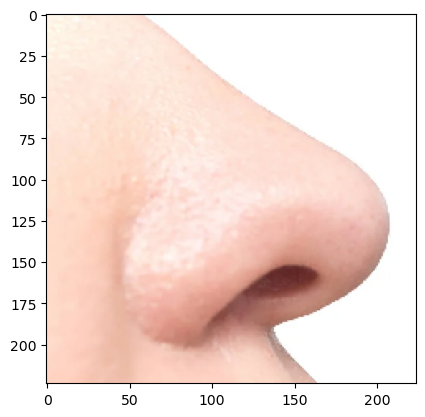

1/1 [==============================] - 1s 1s/step
It's a picture of Nose


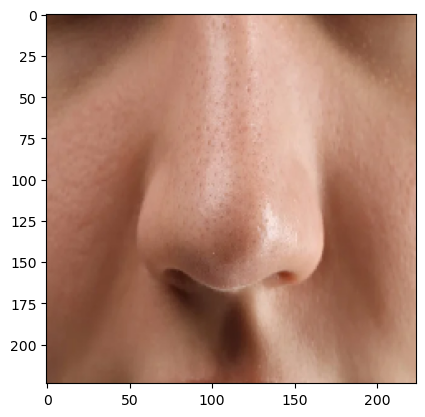

1/1 [==============================] - 0s 137ms/step
It's a picture of Nose


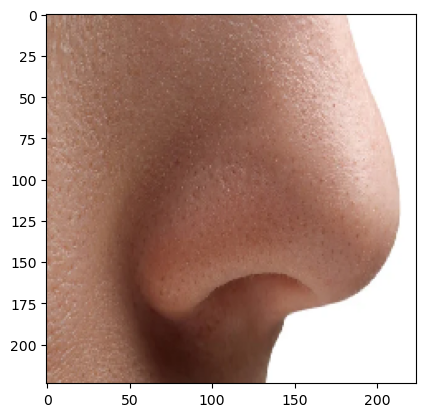

1/1 [==============================] - 0s 135ms/step
It's a picture of Nose


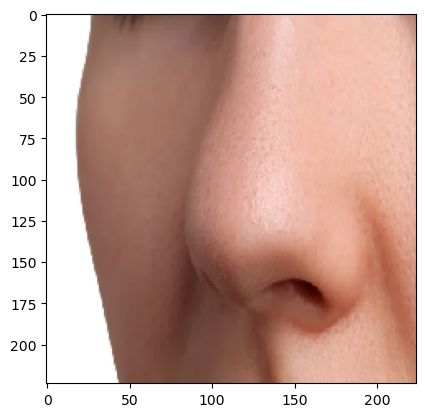

1/1 [==============================] - 0s 124ms/step
It's a picture of Nose


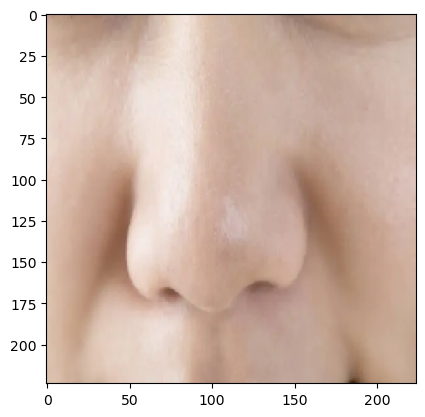

1/1 [==============================] - 0s 136ms/step
It's a picture of Nose


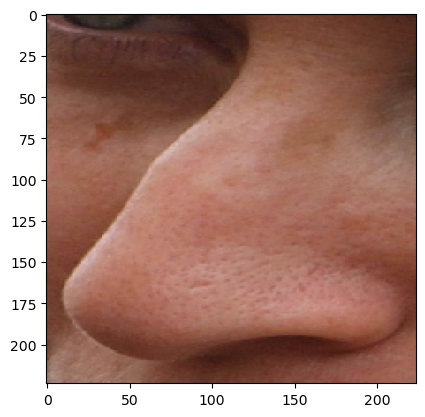

1/1 [==============================] - 0s 139ms/step
It's a picture of Nose


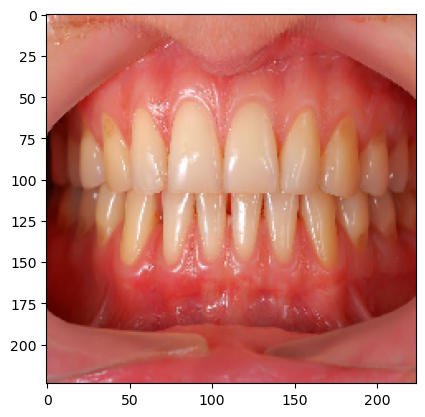

1/1 [==============================] - 0s 131ms/step
It's a picture of Teeth


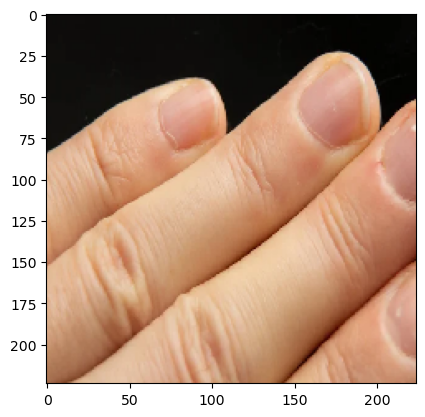

1/1 [==============================] - 0s 126ms/step
It's a picture of Nail


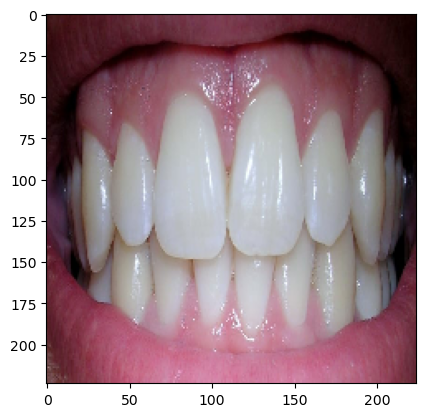

1/1 [==============================] - 0s 135ms/step
It's a picture of Teeth


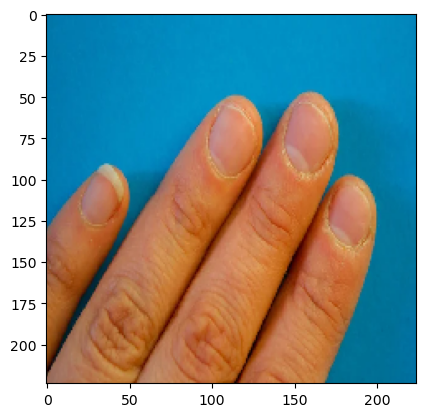

1/1 [==============================] - 0s 147ms/step
It's a picture of Nail


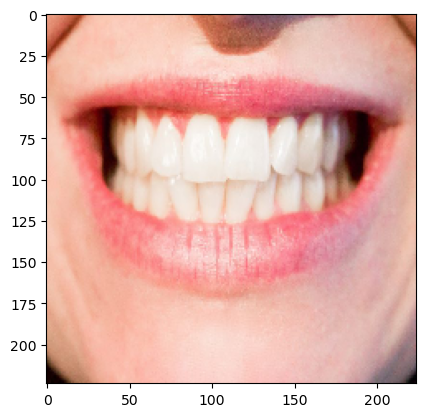

1/1 [==============================] - 0s 135ms/step
It's a picture of Teeth


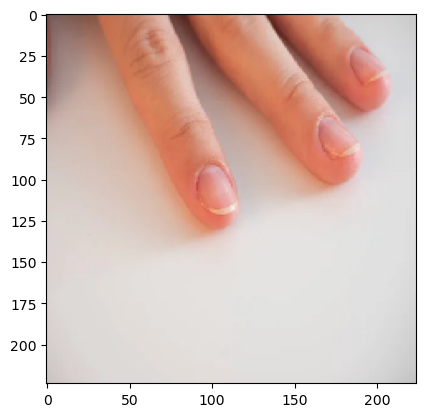

1/1 [==============================] - 0s 134ms/step
It's a picture of Nail


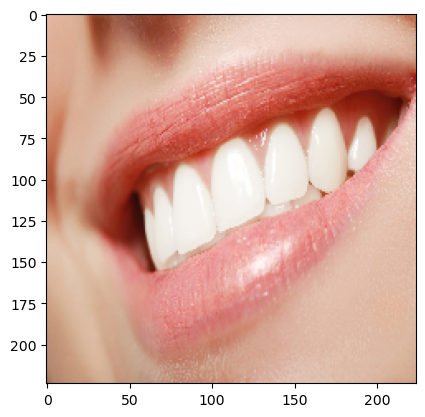

1/1 [==============================] - 0s 129ms/step
It's a picture of Teeth


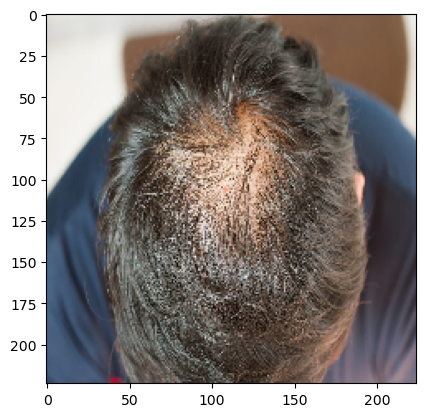

1/1 [==============================] - 0s 131ms/step
It's a picture of Hair


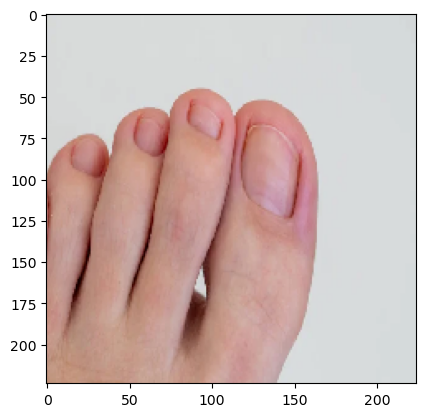

1/1 [==============================] - 0s 132ms/step
It's a picture of Nail


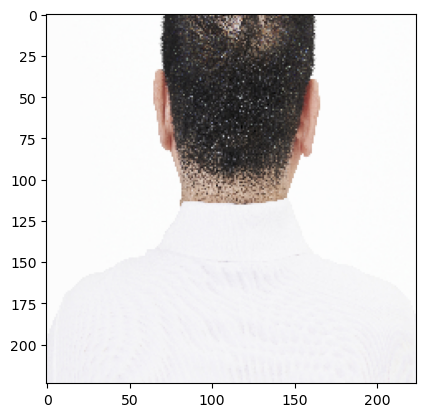

1/1 [==============================] - 0s 130ms/step
It's a picture of Hair


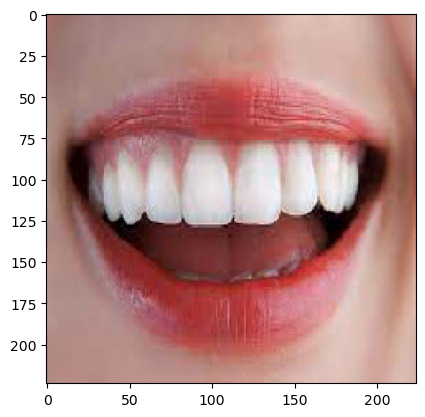

1/1 [==============================] - 0s 120ms/step
It's a picture of Teeth


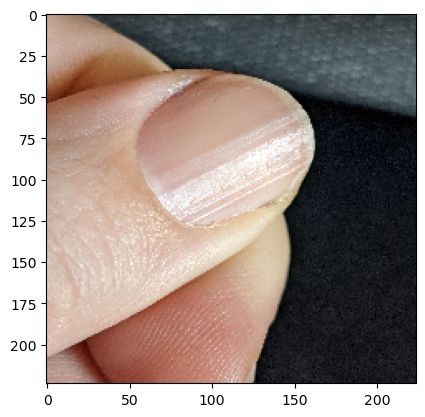

1/1 [==============================] - 0s 142ms/step
It's a picture of Nail


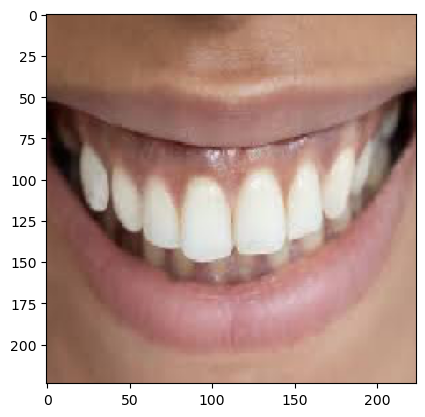

1/1 [==============================] - 0s 141ms/step
It's a picture of Teeth


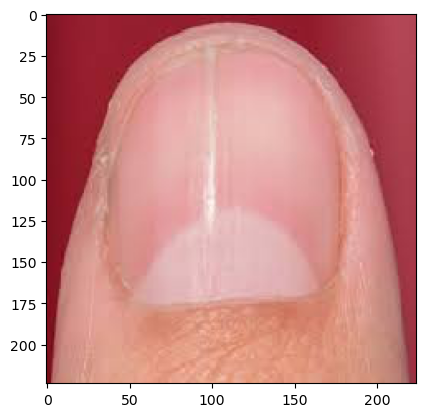

1/1 [==============================] - 0s 134ms/step
It's a picture of Nail


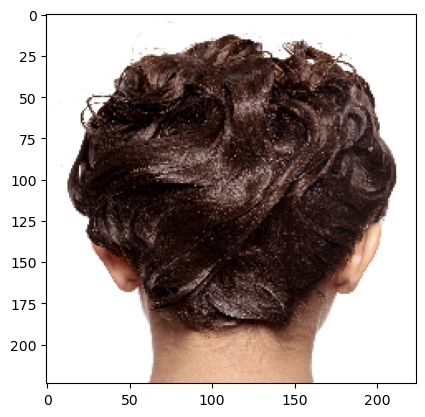

1/1 [==============================] - 0s 124ms/step
It's a picture of Hair


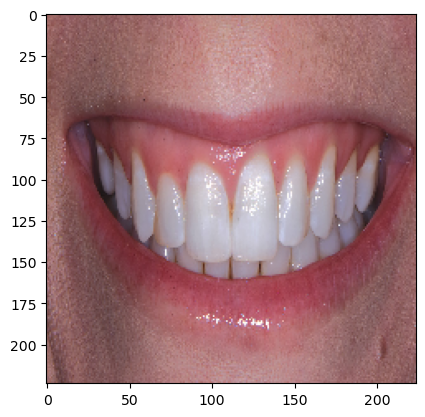

1/1 [==============================] - 0s 135ms/step
It's a picture of Teeth


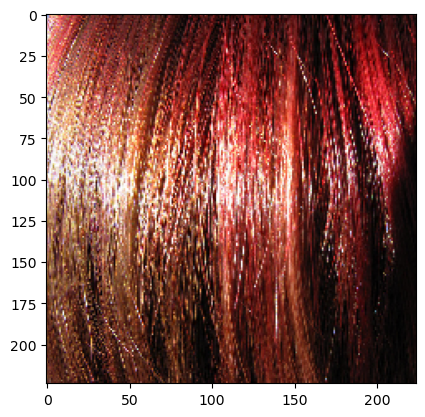

1/1 [==============================] - 0s 129ms/step
It's a picture of Hair


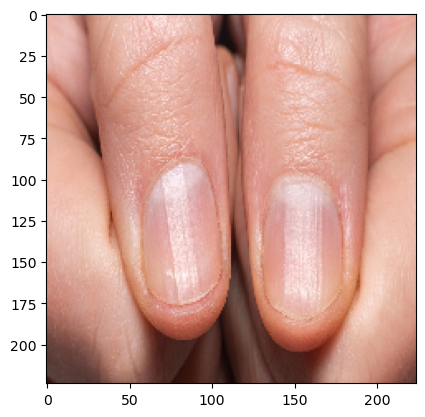

1/1 [==============================] - 0s 157ms/step
It's a picture of Nail


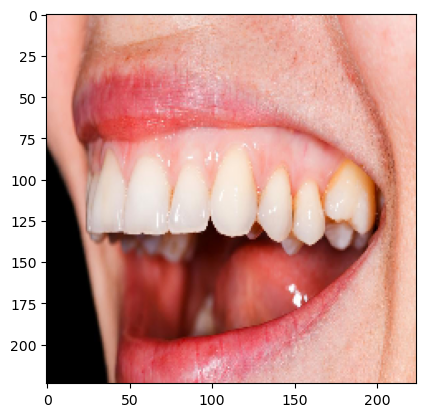

1/1 [==============================] - 0s 123ms/step
It's a picture of Teeth


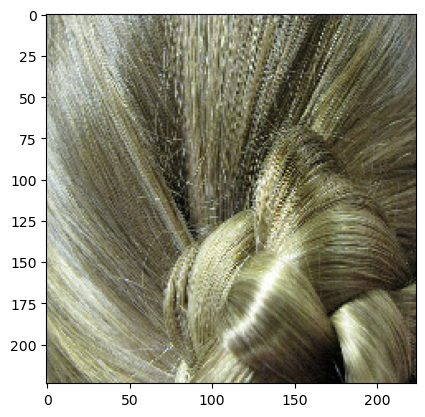

1/1 [==============================] - 0s 122ms/step
It's a picture of Hair


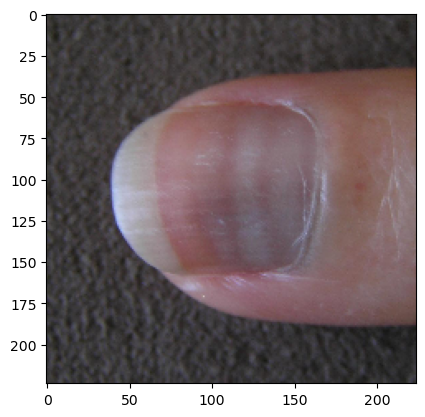

1/1 [==============================] - 0s 124ms/step
It's a picture of Nail


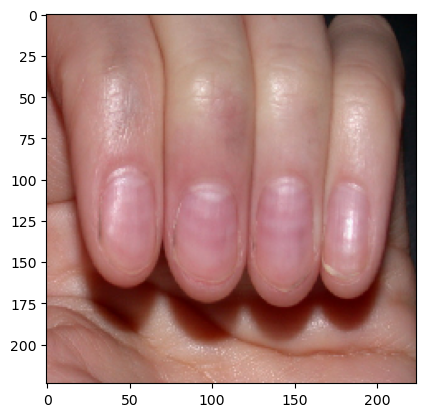

1/1 [==============================] - 0s 130ms/step
It's a picture of Nail


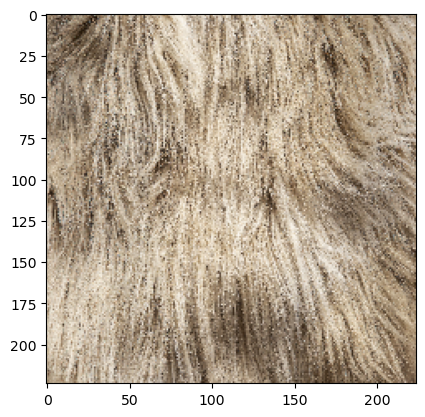

1/1 [==============================] - 0s 140ms/step
It's a picture of Hair


C:\ProgramData\Anaconda3\lib\site-packages\PIL\Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


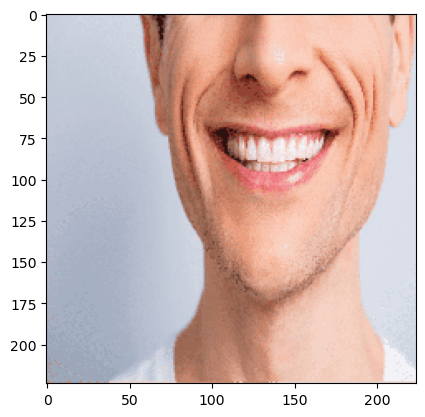

1/1 [==============================] - 0s 149ms/step
It's a picture of Teeth


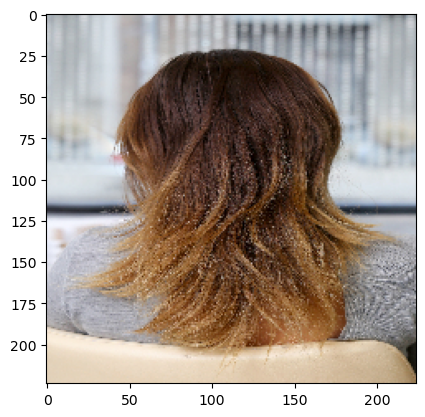

1/1 [==============================] - 0s 128ms/step
It's a picture of Hair


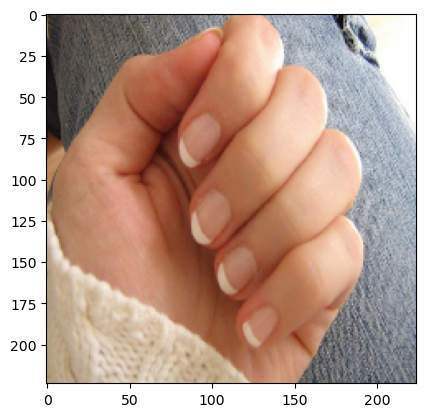

1/1 [==============================] - 0s 128ms/step
It's a picture of Nail


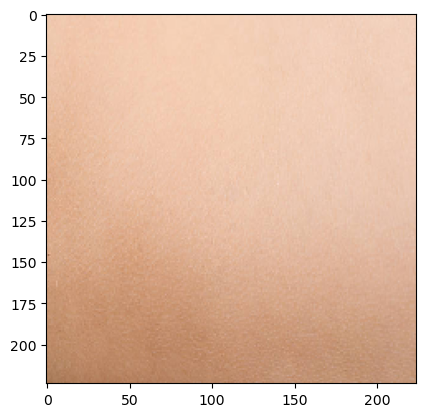

1/1 [==============================] - 0s 135ms/step
It's a picture of Skin


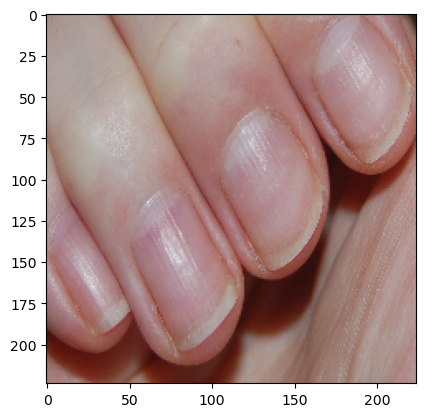

1/1 [==============================] - 0s 122ms/step
It's a picture of Nail


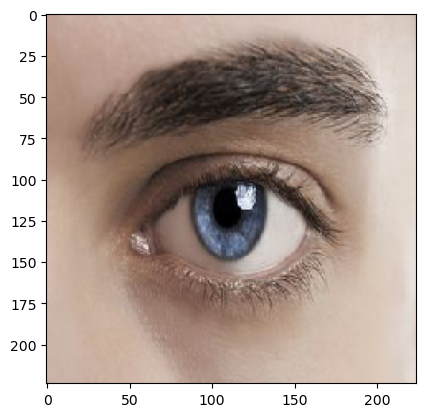

1/1 [==============================] - 0s 130ms/step
It's a picture of Eye


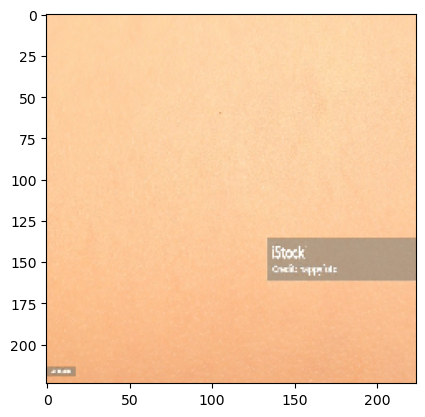

1/1 [==============================] - 0s 132ms/step
It's a picture of Skin


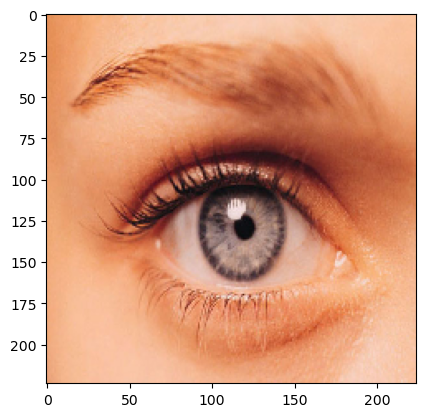

1/1 [==============================] - 0s 151ms/step
It's a picture of Eye


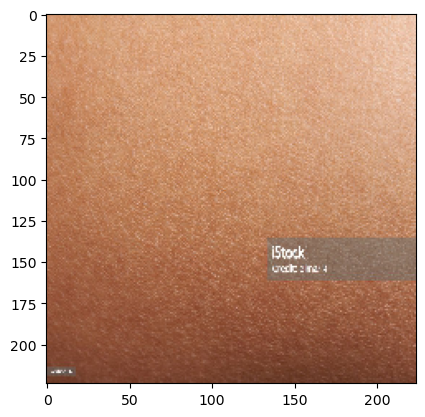

1/1 [==============================] - 0s 143ms/step
It's a picture of Skin


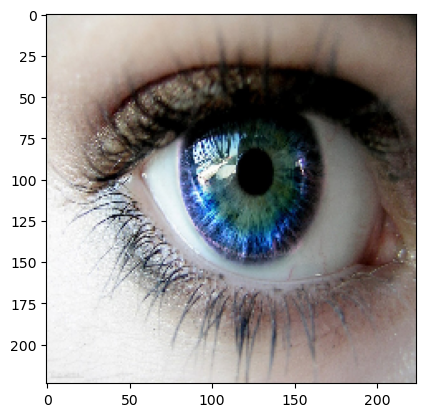

1/1 [==============================] - 0s 130ms/step
It's a picture of Eye


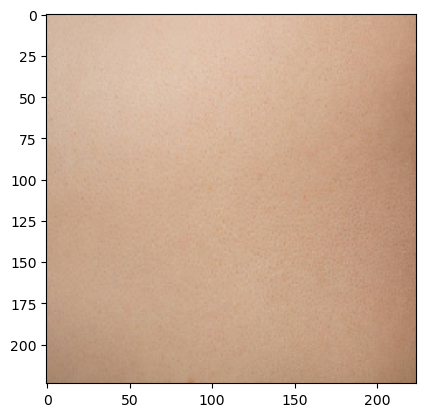

1/1 [==============================] - 0s 133ms/step
It's a picture of Skin


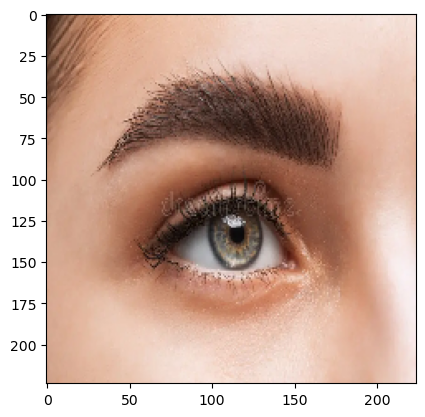

1/1 [==============================] - 0s 128ms/step
It's a picture of Eye


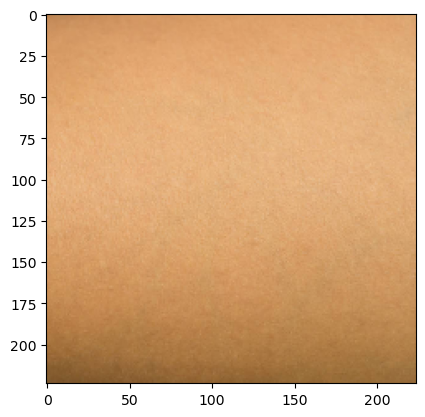

1/1 [==============================] - 0s 127ms/step
It's a picture of Skin


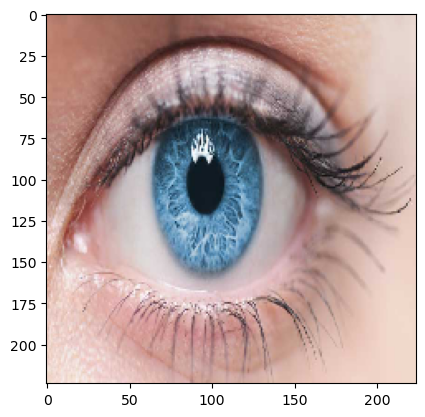

1/1 [==============================] - 0s 130ms/step
It's a picture of Eye


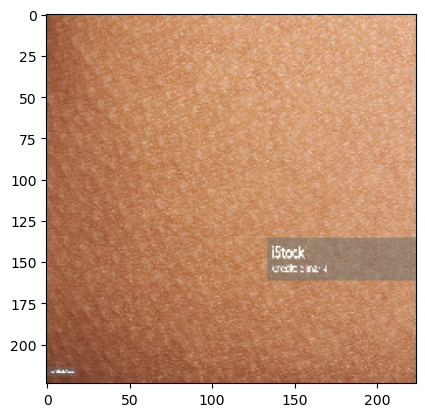

1/1 [==============================] - 0s 130ms/step
It's a picture of Skin


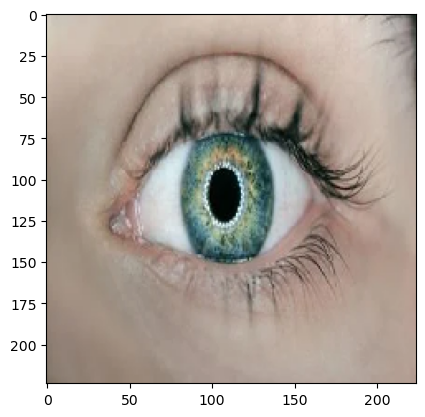

1/1 [==============================] - 0s 120ms/step
It's a picture of Eye


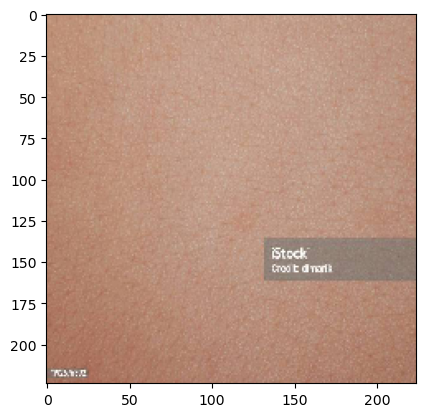

1/1 [==============================] - 0s 137ms/step
It's a picture of Skin


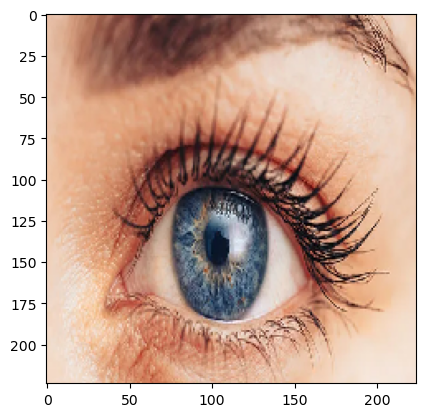

1/1 [==============================] - 0s 130ms/step
It's a picture of Eye


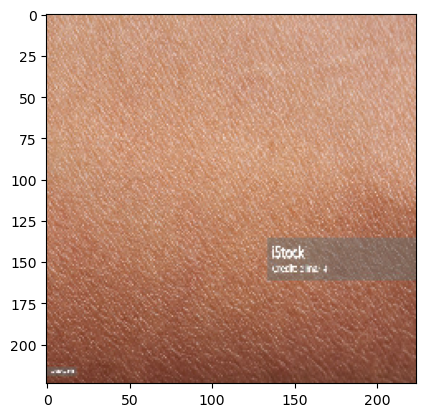

1/1 [==============================] - 0s 127ms/step
It's a picture of Skin


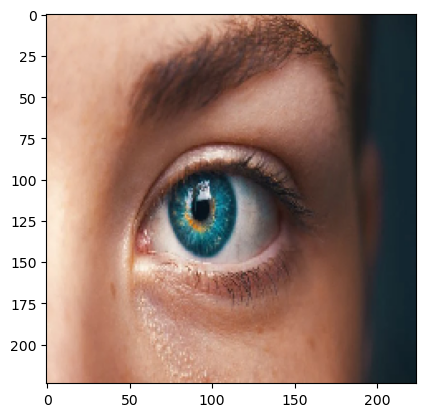

1/1 [==============================] - 0s 143ms/step
It's a picture of Eye


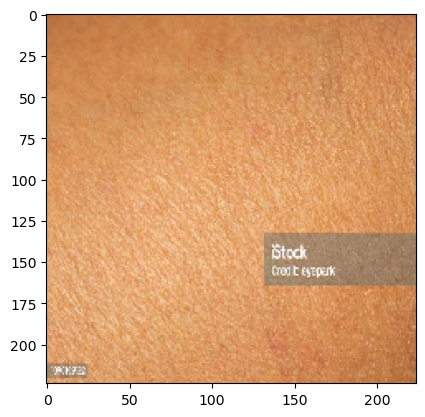

1/1 [==============================] - 0s 129ms/step
It's a picture of Skin


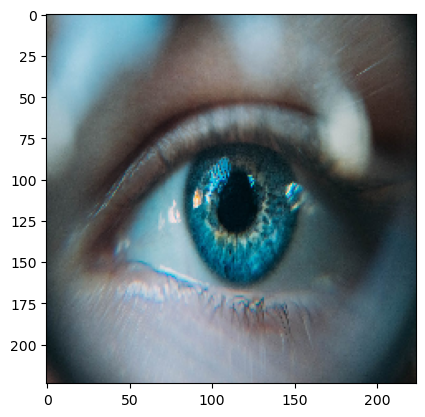

1/1 [==============================] - 0s 131ms/step
It's a picture of Eye


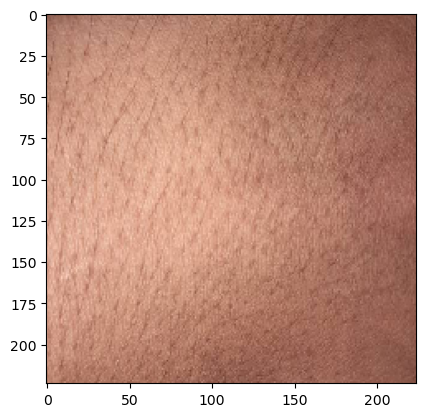

1/1 [==============================] - 0s 121ms/step
It's a picture of Skin


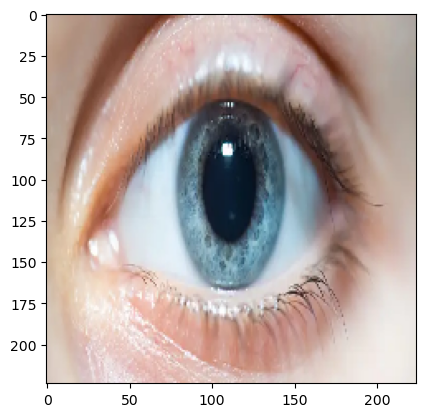

1/1 [==============================] - 0s 136ms/step
It's a picture of Eye


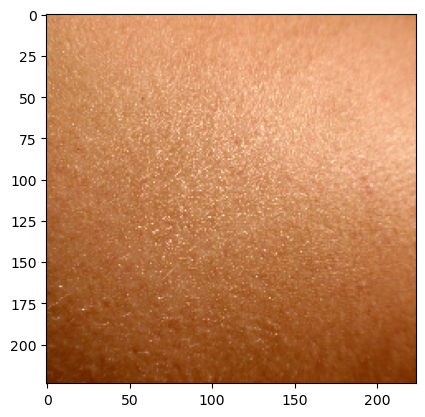

1/1 [==============================] - 0s 135ms/step
It's a picture of Skin


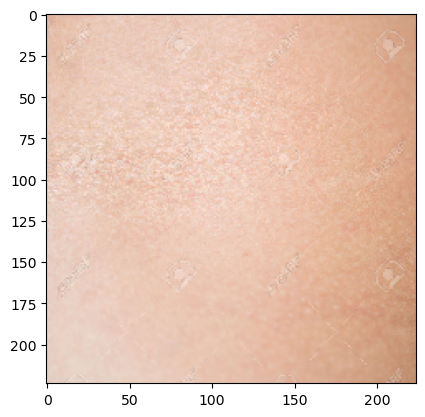

1/1 [==============================] - 0s 123ms/step
It's a picture of Skin


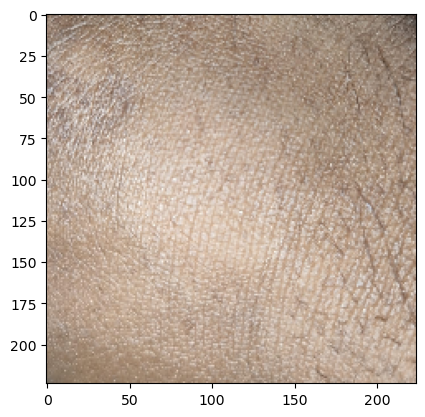

1/1 [==============================] - 0s 128ms/step
It's a picture of Skin


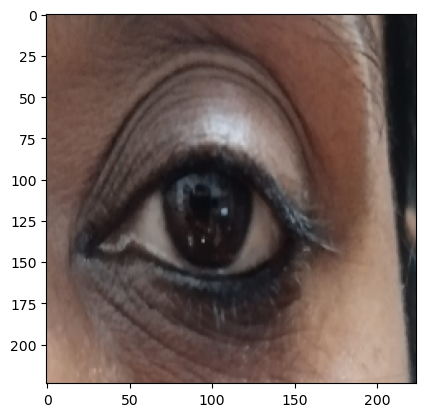

1/1 [==============================] - 0s 119ms/step
It's a picture of Eye


In [21]:
for i in os.listdir(test_data_dir):
    img = image.load_img(test_data_dir + '//' + i, target_size = (224,224,3))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X,axis = 0)
    images = np.vstack([X])
    
    val = model.predict(images)
    predicted_class = np.argmax(val)
    
    if predicted_class == 0:
        print("It's a picture of Eye")
    elif predicted_class == 1:
        print("It's a picture of Hair")
    elif predicted_class == 2:
        print("It's a picture of Nail")
    elif predicted_class == 3:
        print("It's a picture of Nose")
    elif predicted_class == 4:
        print("It's a picture of Skin")
    elif predicted_class == 5:
        print("It's a picture of Teeth")